In [4]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [74]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjResNew.R')

In [6]:
out.figs.dir <- '../2.results/xenium/figs'
out.data.dir <- '../2.results/xenium/data'

In [7]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [8]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [9]:
brain.st <- readRDS('../0.data/Xenium/xenium.ST.RDS')

In [10]:
brain.sc <- readRDS('../0.data/Xenium/allen_cortex.rds')

In [380]:
brain.st <- brain.st %>% SCTransform(assay = 'Spatial')

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 248 by 36553

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 248 genes, 5000 cells



  |======================================================================| 100%


Found 2 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 248 genes



  |======================================================================| 100%


Computing corrected count matrix for 248 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 4.681144 secs

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT



In [58]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

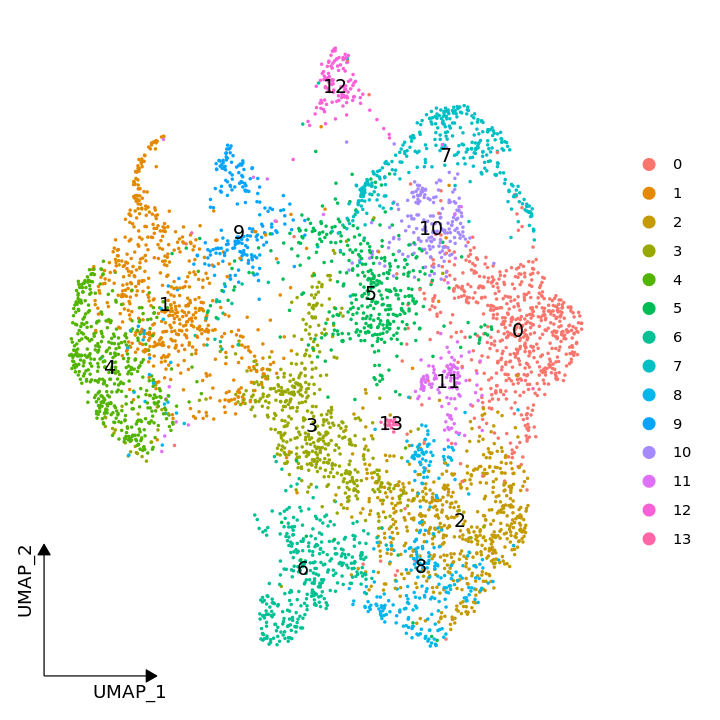

In [146]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'BRCA.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [152]:
brain.sc@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,X,percent.mito,subtype,celltype_subset,celltype_minor,celltype_major
,<chr>,<dbl>,<int>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
CID4471_CCGGTAGAGATTACCC,CID4471,4143,1760,CID4471_CCGGTAGAGATTACCC,7.289404,ER+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID3921_GGCAATTGTGATGTGG,CID3921,20181,4146,CID3921_GGCAATTGTGATGTGG,6.516030,HER2+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID44041_GTCAAGTAGGGTGTTG,CID44041,1675,853,CID44041_GTCAAGTAGGGTGTTG,4.059701,TNBC,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID4530N_GCGCCAAGTCAGGACA,CID4530N,10408,3234,CID4530N_GCGCCAAGTCAGGACA,5.130669,ER+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID4290A_GTCAAGTGTTAAGATG,CID4290A,2481,1240,CID4290A_GTCAAGTGTTAAGATG,9.633212,ER+,Endothelial ACKR1,Endothelial ACKR1,Endothelial
CID4471_CCCAGTTGTTGCGCAC,CID4471,6254,2100,CID4471_CCCAGTTGTTGCGCAC,5.052766,ER+,Endothelial RGS5,Endothelial RGS5,Endothelial


In [153]:
Idents(brain.sc) <- brain.sc$celltype_major

In [154]:
options(future.globals.maxSize = 5000000 * 1024^2, future.seed = TRUE)

brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [15]:
set.seed(2023063) 
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$subclass))) %>% `names<-`(unique(brain.sc$subclass))

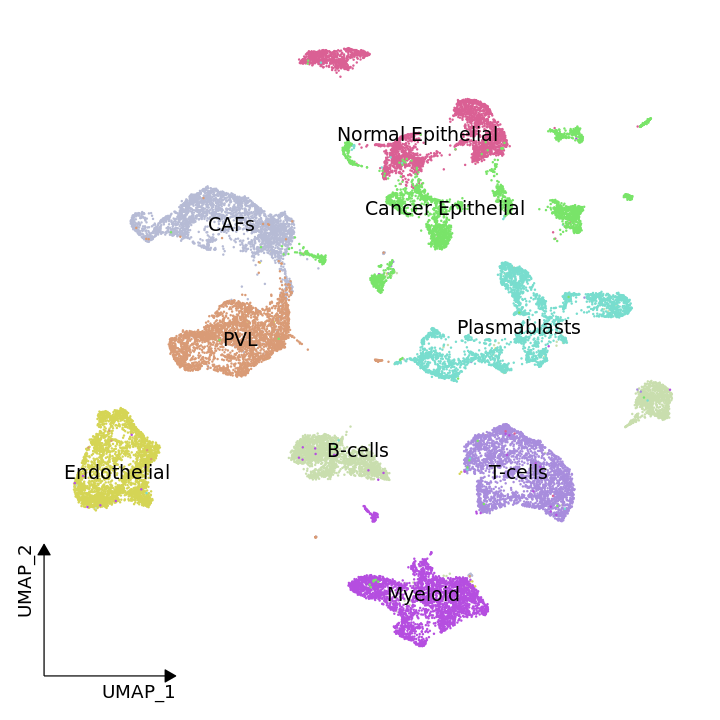

In [156]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'thymus.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [157]:
levels(brain.sc) %>% length

[1] 9

In [315]:
dim(brain.sc)

[1] 23877 27000

In [316]:
dim(brain.st)

[1] 19451  4784

In [158]:
#markers <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

In [159]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [160]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 50, wt = avg_log2FC)

In [161]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

In [712]:
sum(GetAssayData(brain.st, slot = 'counts') == 0)
sum(GetAssayData(brain.st, slot = 'counts') > 0)

[1] 6549930

[1] 2515214

In [717]:
min(colSums(GetAssayData(brain.st, slot = 'counts')))
median(colSums(GetAssayData(brain.st, slot = 'counts')))

[1] 133

[1] 207

In [719]:
dim(GetAssayData(brain.st, slot = 'counts'))

[1]   248 36553

In [720]:
brain.st

An object of class Seurat 
496 features across 36553 samples within 2 assays 
Active assay: SCT (248 features, 248 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: Spatial
 1 image present: image

In [718]:
head(brain.st$nCount_Spatial)

1   2   3   4   5   6 
384 146  81 314 639 270

In [710]:
length(unique(brain.sc$subclass))

[1] 23

In [711]:
brain.sc

An object of class Seurat 
34617 features across 14249 samples within 1 assay 
Active assay: RNA (34617 features, 0 variable features)
 2 layers present: counts, data

### Showing the projection performance for Cell2Spatial

In [455]:
cell2spatial <- readRDS('../2.results/xenium/xenium.cell2spatial.RDS')
cell2spatial

An object of class Seurat 
242 features across 36553 samples within 1 assay 
Active assay: Spatial (242 features, 0 variable features)
 2 layers present: counts, data
 1 image present: image

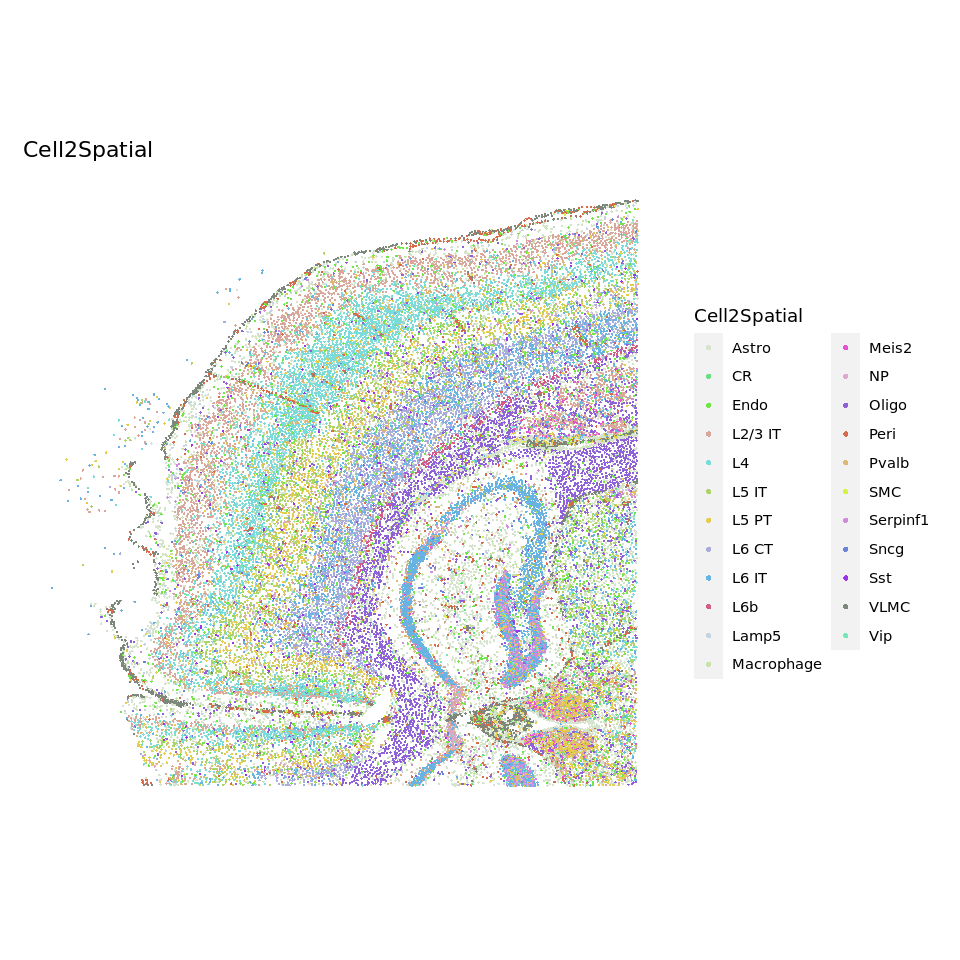

In [361]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'Cell2Spatial', pt.size = 1.0,  stroke = NA, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [309]:
length(cell2spatial$Cell2Spatial %>% unique)

[1] 23

In [310]:
f.ctypes <- cell2spatial$Cell2Spatial %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, Cell2Spatial == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cell2spatial, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

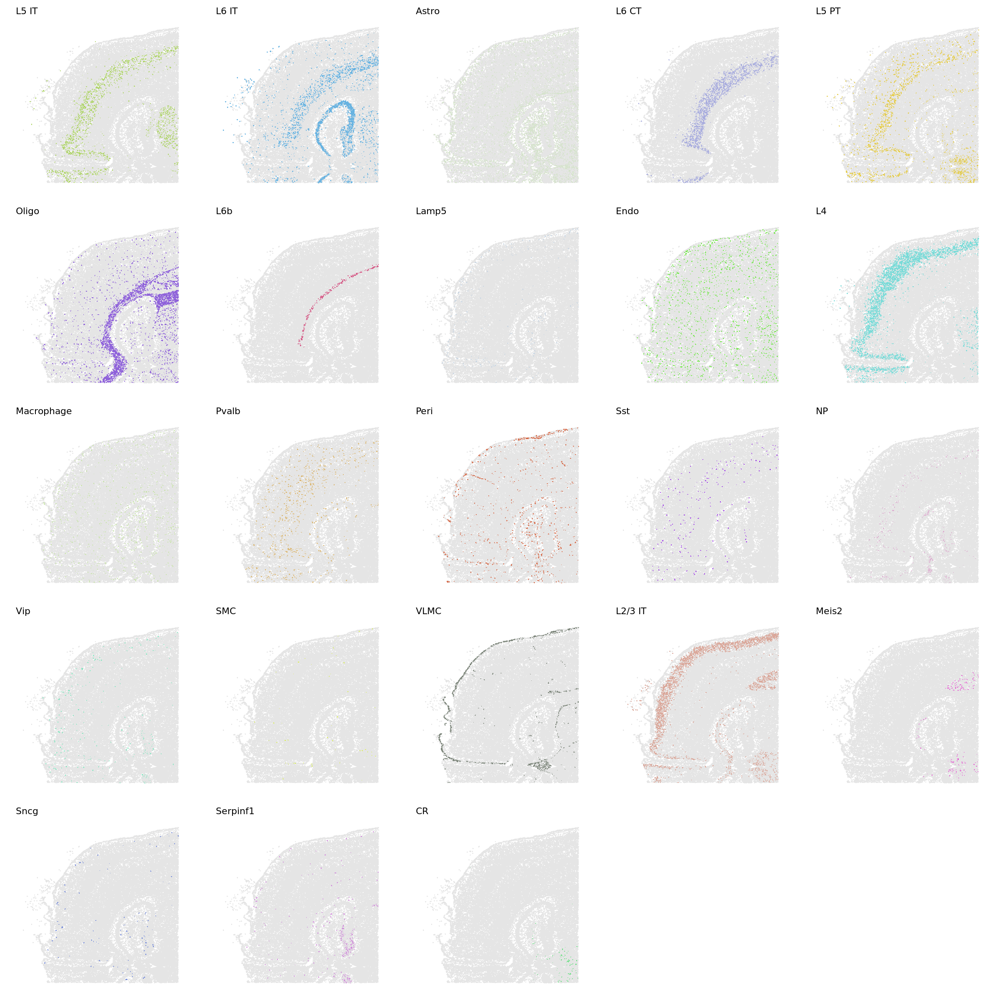

In [311]:
options(repr.plot.width = 20, repr.plot.height = 20)
ggarrange(plotlist = gps, nrow = 5, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 20)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 20)

### Showing the projection performance for CytoSpace

In [239]:
cytospace <- forCytoSpace('../2.results/xenium/cytospace/', brain.sc, brain.st)

In [317]:
cells <- cytospace@meta.data[!duplicated(cytospace@meta.data$SpotID), ] %>% rownames
cytospace <- cytospace[, cells]

In [318]:
head(cytospace@meta.data)

,UniqueCID,OriginalCID,CellType,SpotID,row,col
,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>
UCID00000,UCID00000,F2S4_170323_014_D01,Macrophage,20247,3277.265,3190.8961
UCID00001,UCID00001,F2S4_170526_002_G01,NP,34824,4098.167,2908.8116
UCID00002,UCID00002,F2S4_160706_001_C01,L6 IT,13896,2811.259,933.6646
UCID00003,UCID00003,F2S4_160401_004_E01,Pvalb,21822,1584.172,1941.8051
UCID00004,UCID00004,F2S4_160805_002_F01,Pvalb,4723,1918.593,2036.7893
UCID00005,UCID00005,F2S4_160330_024_G01,L4,12883,3235.735,1344.9910


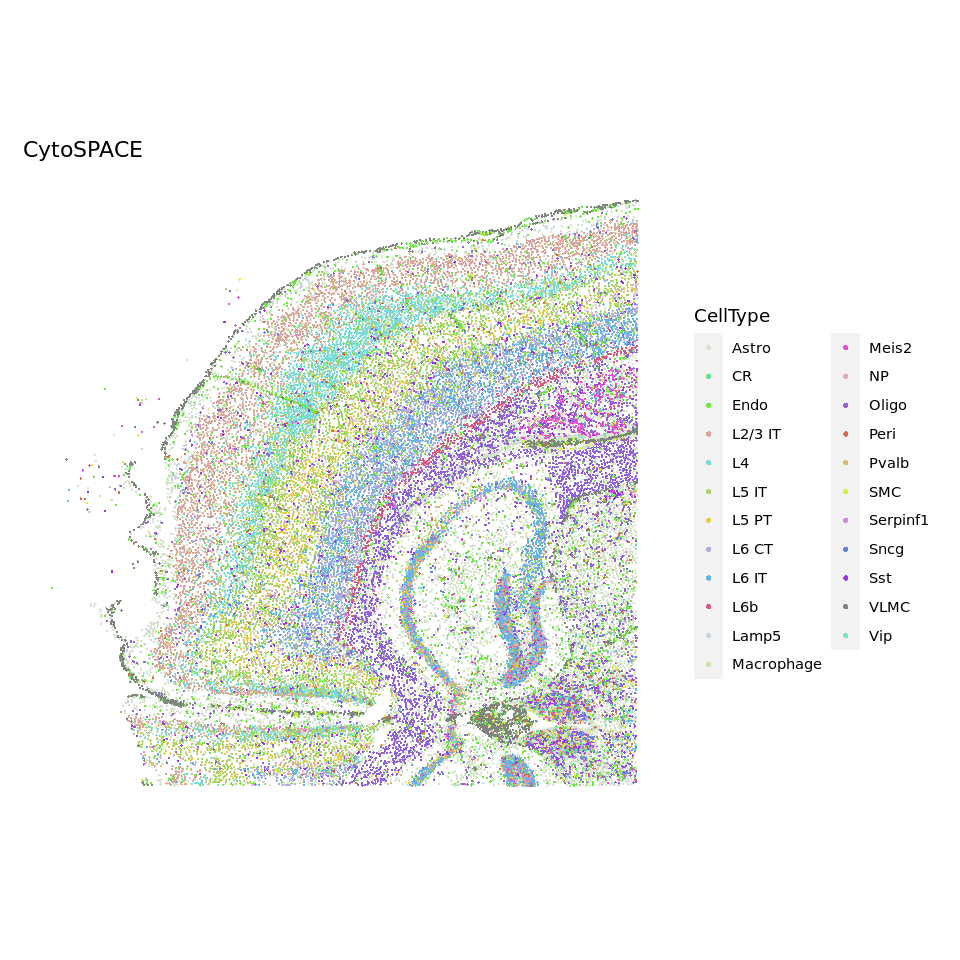

In [319]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 1, cols = cell.colors, stroke =NA) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [320]:
length(cytospace$CellType %>% unique)

[1] 23

In [321]:
f.ctypes <- cytospace$CellType  %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cytospace, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

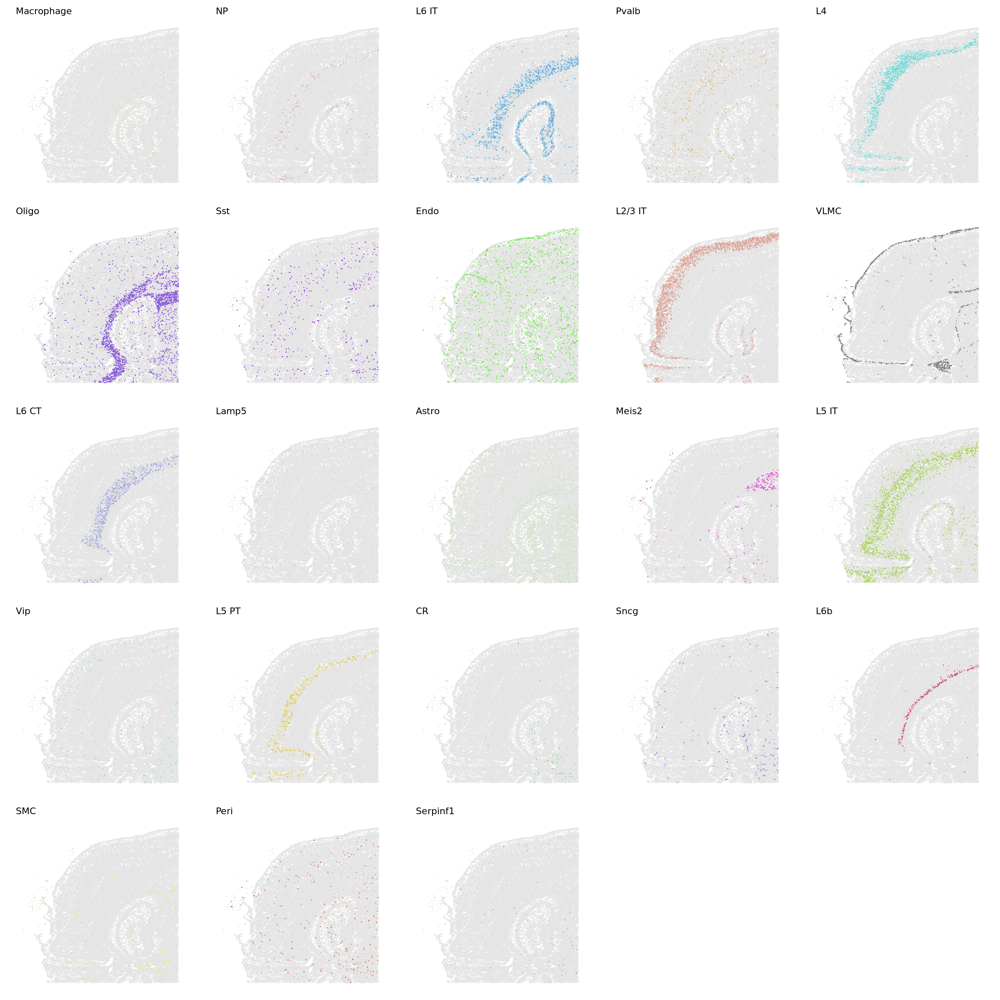

In [322]:
options(repr.plot.width = 20, repr.plot.height = 20)
ggarrange(plotlist = gps, nrow = 5, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 20)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 20)

### Showing the projection performance for tangram

In [323]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

In [324]:
source('modules/reformatProjResNew.R')

In [325]:
tangram <- forTangram('../2.results/xenium/data/xenium_tangram.xls', brain.sc, brain.st)

In [326]:
tangram@meta.data %>% head

,X,orig.ident,nCount_RNA,nFeature_RNA,sample_id,sample_type,organism,donor,sex,age_days,⋯,cluster,confusion_score,cluster_correlation,core_intermediate_call,SpotID,row,col,NA,x.new,y.new
,<chr>,<int>,<dbl>,<int>,<int>,<chr>,<chr>,<int>,<chr>,<int>,⋯,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
F1S4_160108_001_A01,F1S4_160108_001_A01,0,1730700,9029,527128530,Cells,Mus musculus,225675,M,53,⋯,Vip Arhgap36 Hmcn1,0.4385,0.8372286,Intermediate,32642,3357.424,2083.773,32642,3363.486,2087.2585
F1S4_160108_001_B01,F1S4_160108_001_B01,0,1909605,10207,527128536,Cells,Mus musculus,225675,M,53,⋯,Lamp5 Lsp1,0.1025,0.8787432,Core,12135,4700.794,1930.442,12135,4697.801,1928.8764
F1S4_160108_001_C01,F1S4_160108_001_C01,0,1984948,10578,527128542,Cells,Mus musculus,225675,M,53,⋯,Lamp5 Lsp1,0.0195,0.8870837,Core,15400,4571.204,3232.551,15400,4576.953,3235.4072
F1S4_160108_001_D01,F1S4_160108_001_D01,0,2291552,8482,527128548,Cells,Mus musculus,225675,M,53,⋯,Vip Crispld2 Htr2c,0.2734,0.8435516,Core,31358,4032.082,2263.368,31358,4023.844,2258.0304
F1S4_160108_001_E01,F1S4_160108_001_E01,0,1757463,8697,527128554,Cells,Mus musculus,225675,M,53,⋯,Lamp5 Plch2 Dock5,0.7532,0.8549944,Core,7996,4565.012,723.258,7996,4559.162,726.0428
F1S4_160108_001_F01,F1S4_160108_001_F01,0,1837003,8990,527128560,Cells,Mus musculus,225675,M,53,⋯,Sst Tac1 Tacr3,0.4291,0.8560629,Core,13691,2870.304,1084.453,13691,2869.173,1084.1417


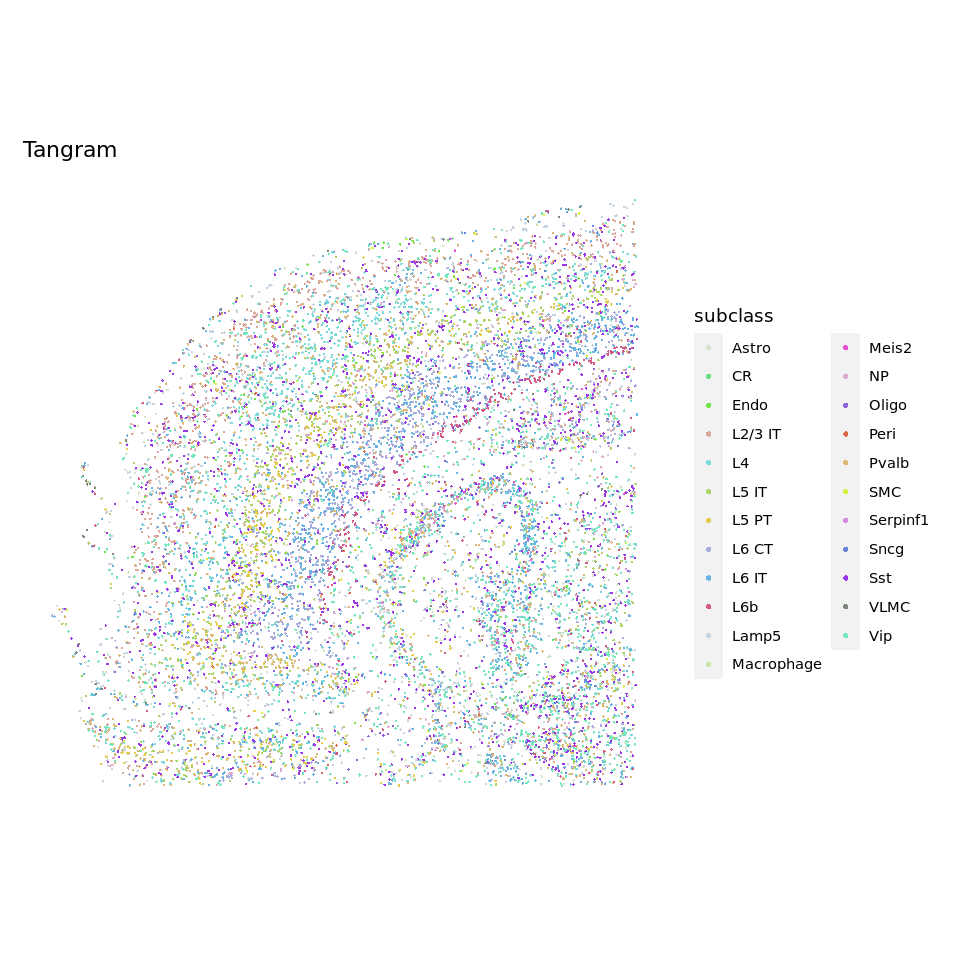

In [327]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'subclass', pt.size = 1.0,  cols = cell.colors, stroke = NA) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [329]:
length(f.ctypes <- tangram$subclass %>% unique)

[1] 23

In [330]:
length(f.ctypes)

[1] 23

In [331]:
f.ctypes <- tangram$subclass %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, subclass == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(tangram, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

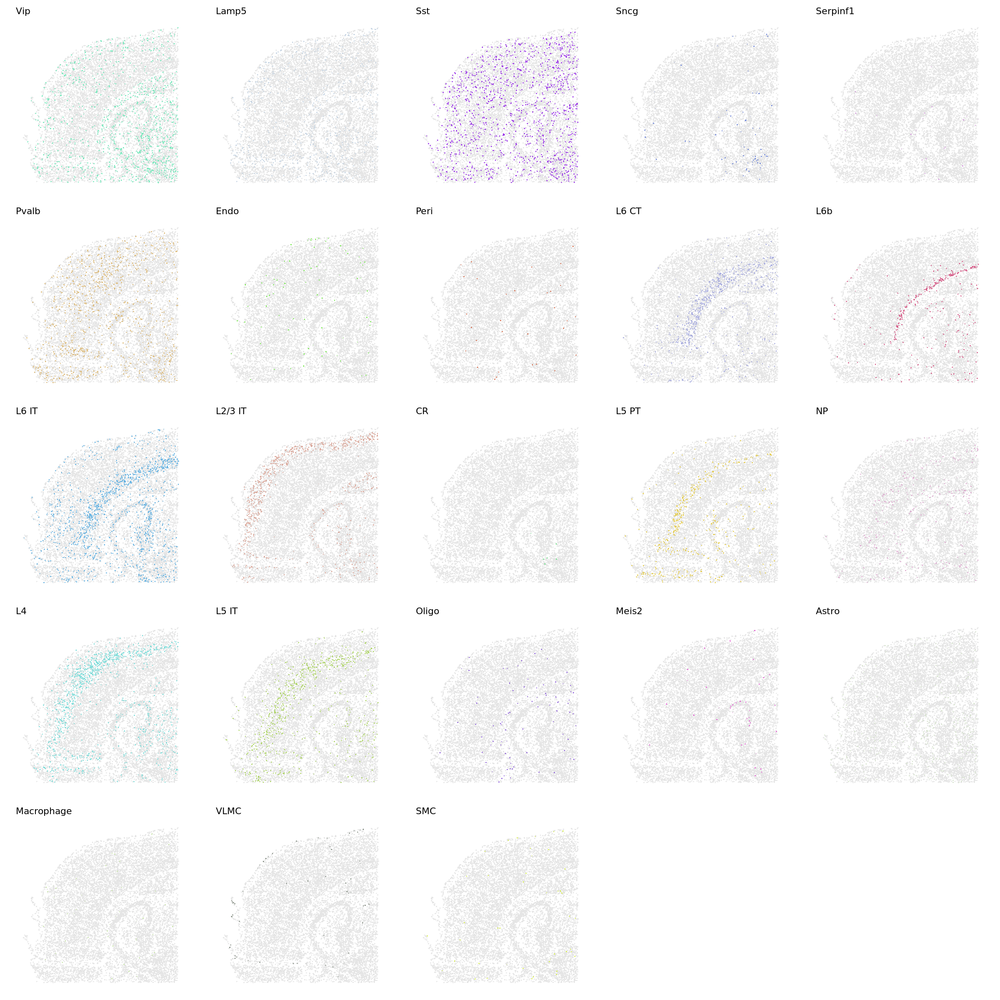

In [332]:
options(repr.plot.width = 20, repr.plot.height = 20)
ggarrange(plotlist = gps, nrow = 5, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 20)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 20)

### Showing the projection performance for Seurat

In [59]:
seurat.res <- readRDS('../2.results/xenium/xenium.seurat.RDS') 

In [60]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,predicted.id,prediction.score.Vip,prediction.score.Lamp5,prediction.score.Sst,prediction.score.Sncg,prediction.score.Serpinf1,prediction.score.Pvalb,⋯,prediction.score.NP,prediction.score.L4,prediction.score.L5.IT,prediction.score.Oligo,prediction.score.Meis2,prediction.score.Astro,prediction.score.Macrophage,prediction.score.VLMC,prediction.score.SMC,prediction.score.max
,<fct>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,SeuratProject,378,94,L5 IT,0,0,0,0,0,0,⋯,0,0,0.54041789,0.0000000,0,0,0,0,0,0.5404179
2,SeuratProject,143,62,L6 IT,0,0,0,0,0,0,⋯,0,0,0.27942217,0.0000000,0,0,0,0,0,0.7205778
3,SeuratProject,80,47,Oligo,0,0,0,0,0,0,⋯,0,0,0.00000000,1.0000000,0,0,0,0,0,1.0000000
4,SeuratProject,312,92,L6 CT,0,0,0,0,0,0,⋯,0,0,0.01662339,0.0000000,0,0,0,0,0,0.9628133
5,SeuratProject,636,96,L6 IT,0,0,0,0,0,0,⋯,0,0,0.00000000,0.0000000,0,0,0,0,0,1.0000000
6,SeuratProject,267,88,L6 CT,0,0,0,0,0,0,⋯,0,0,0.04615181,0.1290114,0,0,0,0,0,0.6654763


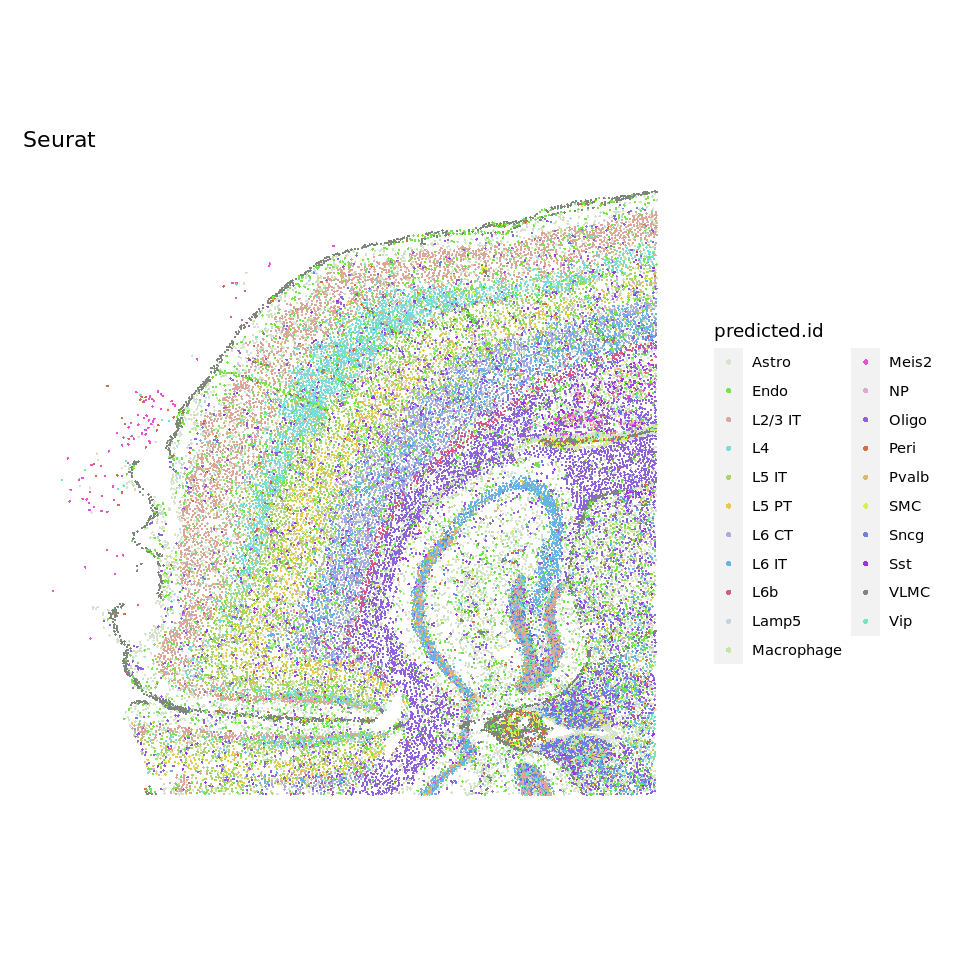

In [607]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'predicted.id', pt.size = 1.0, cols = cell.colors, stroke = NA) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [62]:
length(f.ctypes <- seurat.res$predicted.id %>% unique)

[1] 21

In [245]:
head(seurat.res@images$image@coordinates)

,x,y,cells
,<dbl>,<dbl>,<chr>
1,1898.815,2540.963,1
2,1895.305,2532.627,2
3,2368.073,2534.409,3
4,1903.726,2560.010,4
5,1917.481,2543.132,5
6,1926.540,2560.044,6


In [305]:
f.ctypes <- seurat.res$predicted.id %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, predicted.id == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(seurat.res, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

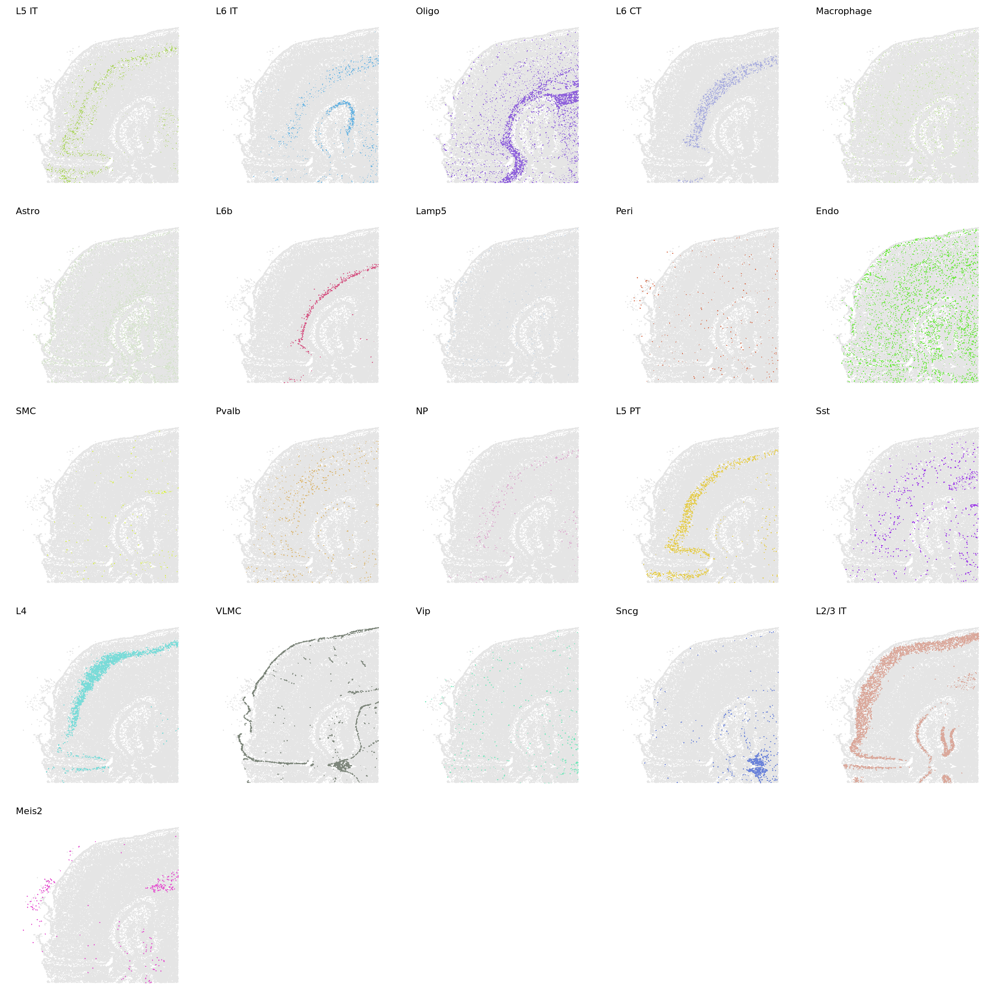

In [306]:
options(repr.plot.width = 20, repr.plot.height = 20)
ggarrange(plotlist = gps, nrow = 5, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 20, height = 20)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 20, height = 20)

#### Compare the marker gene expression

In [489]:
options(future.globals.maxSize = 5000000 * 1024^2, future.seed = TRUE)

In [490]:
Idents(seurat.res) <- seurat.res$predicted.id
de.markers <- FindAllMarkers(seurat.res, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25)

Calculating cluster L5 IT

Calculating cluster L6 IT

Calculating cluster Oligo

Calculating cluster L6 CT

Calculating cluster Macrophage

Calculating cluster Astro

Calculating cluster L6b

Calculating cluster Lamp5

Calculating cluster Peri

Calculating cluster Endo

Calculating cluster SMC

Calculating cluster Pvalb

Calculating cluster NP

Calculating cluster L5 PT

Calculating cluster Sst

Calculating cluster L4

Calculating cluster VLMC

Calculating cluster Vip

Calculating cluster Sncg

Calculating cluster L2/3 IT

Calculating cluster Meis2



In [491]:
top5.markers <- de.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
top5.markers <- split(top5.markers$gene, top5.markers$cluster)

In [492]:
cytospace <- AddModuleScore(cytospace %>% NormalizeData, features = top5.markers)
cell2spatial <- AddModuleScore(cell2spatial %>% NormalizeData, features = top5.markers, nbin = 1)
tangram <- AddModuleScore(tangram %>% NormalizeData, features = top5.markers)
seurat.res <- AddModuleScore(seurat.res %>% NormalizeData, features = top5.markers, nbin = 1)

In [539]:
tar.ctypes <- c('Astro', 'L2/3 IT', 'L4', 'L5 IT',  'L6 CT', 'L6b')
idxes <- which(names(top5.markers) %in% tar.ctypes)

In [536]:
obj.tmp <- subset(seurat.res %>% NormalizeData %>% ScaleData, idents = tar.ctypes)
levels(obj.tmp) <- tar.ctypes

Centering and scaling data matrix



In [541]:
gp <- DoHeatmap(obj.tmp, group.by = 'predicted.id', features = top5.markers[tar.ctypes] %>% unlist %>% unique, group.colors = cell.colors[tar.ctypes]) + scale_fill_gradientn(colors = c("gray", "white", "red"))
ggsave(file.path(out.figs.dir, 'marker.expr.pdf'), width = 5, height = 8)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


In [543]:
tar.ctypes <- c('Astro', 'L2/3 IT', 'L4', 'L5 IT',  'L6 IT', 'L6 CT', 'L6b')
idxes <- which(names(top5.markers) %in% tar.ctypes)

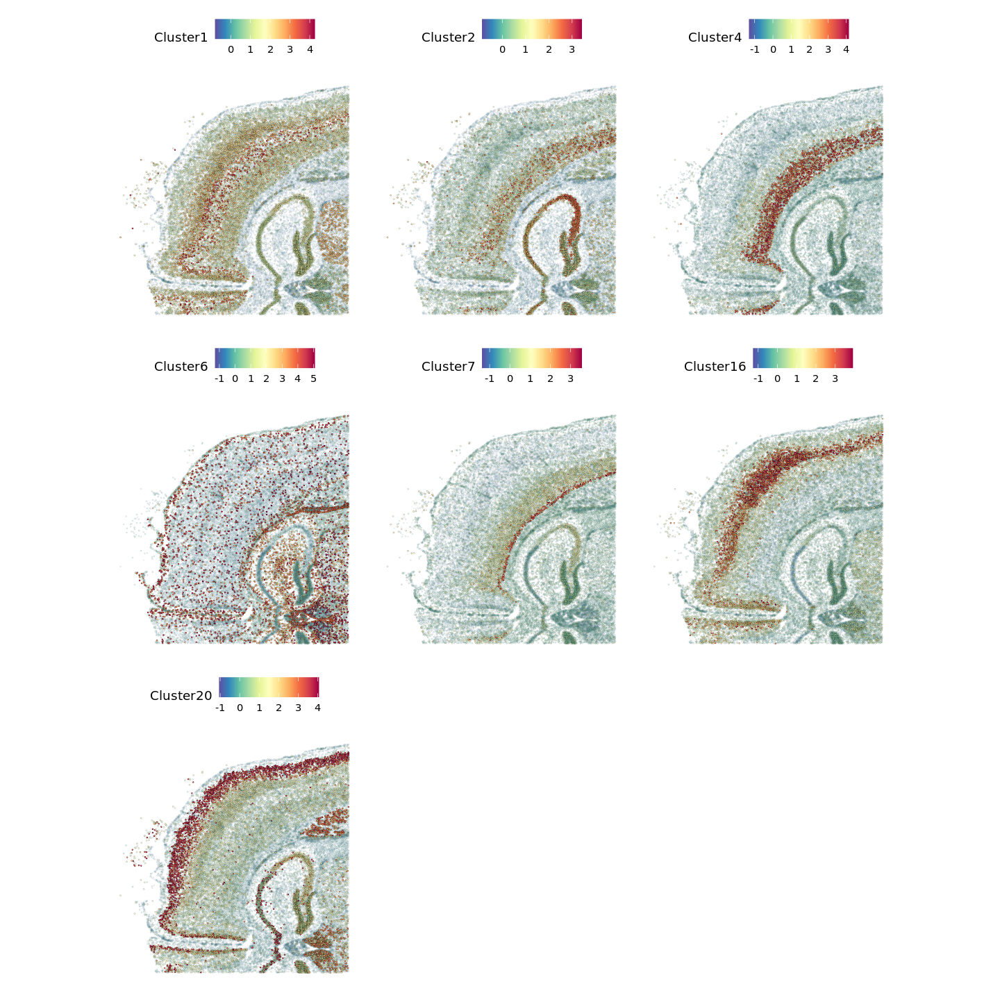

In [501]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cell2spatial %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.pdf'), width = 12, height = 12)

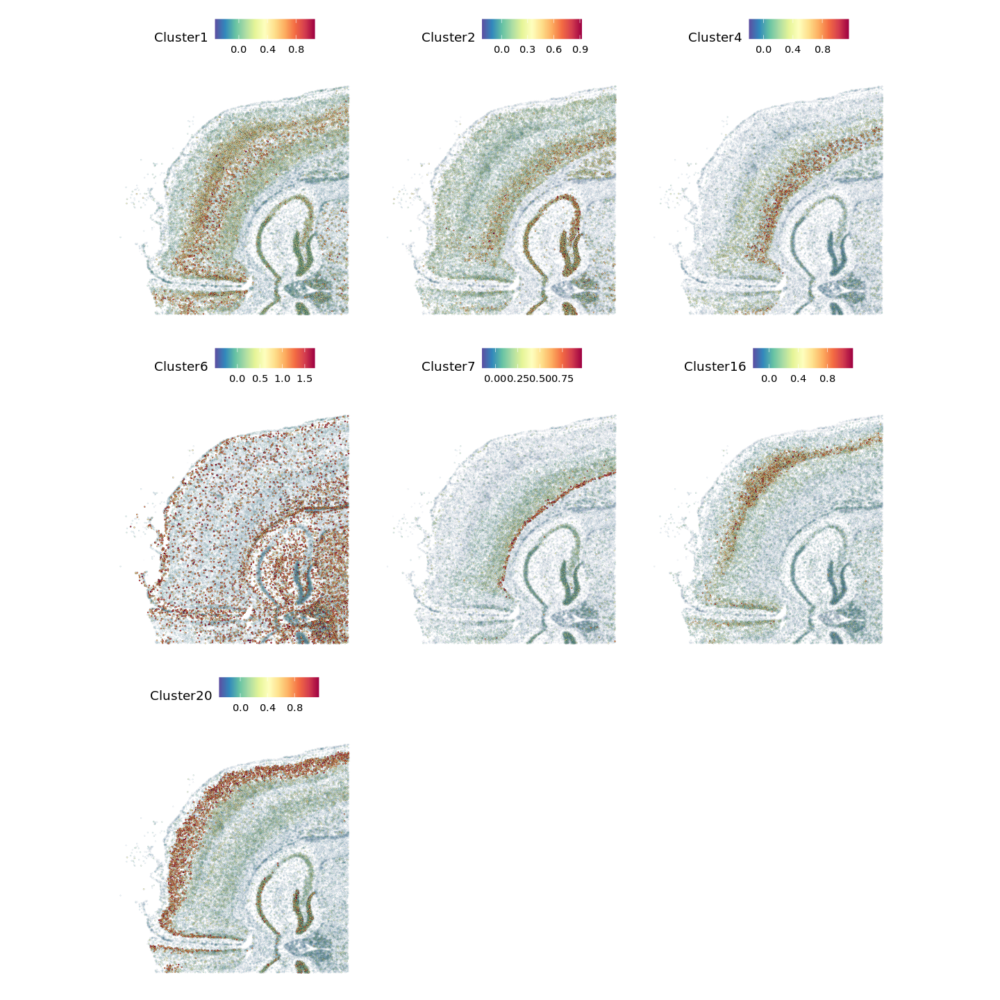

In [498]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cytospace %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cytospace.markers.pdf'), width = 12, height = 12)

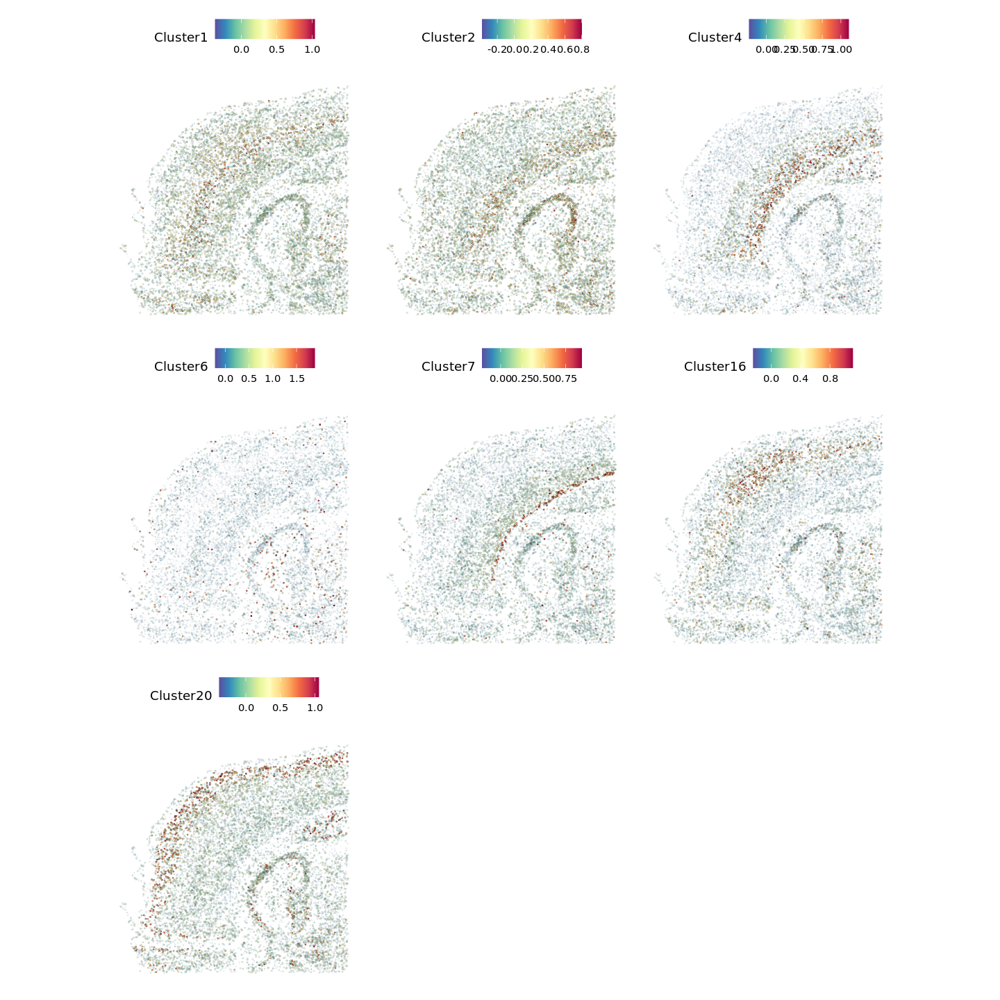

In [502]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(tangram %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'tangram.markers.pdf'), width = 12, height = 12)

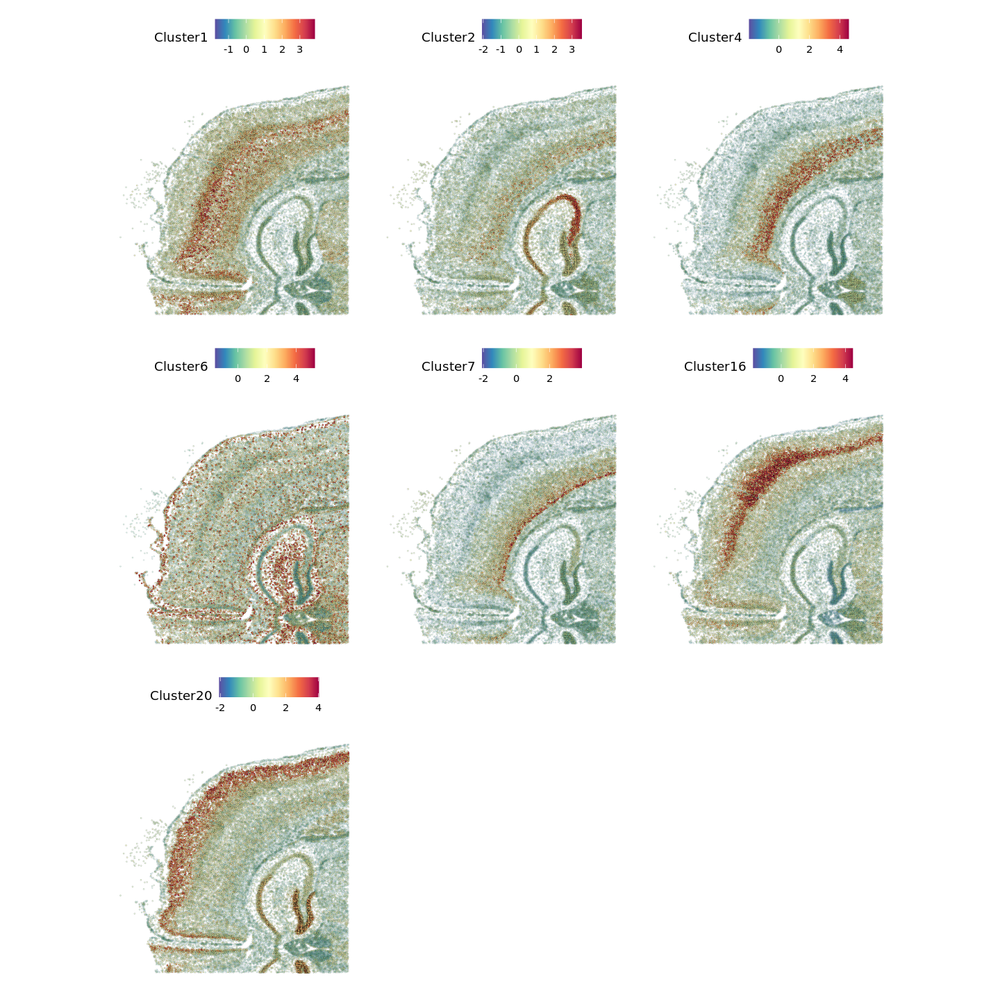

In [527]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(seurat.res, features = paste0('Cluster', idxes), alpha = c(0, 1)) #& scale_fill_gradientn(colors = c("gray90", "white", "red"))
ggsave(file.path(out.figs.dir, 'seurat.markers.pdf'), width = 12, height = 12)

#### FindAllMarkers

In [575]:
library(ggpointdensity)
library(viridis)

In [667]:
tar.ctypes <- c('VLMC', 'L2/3 IT', 'L4', 'L5 PT',  'L6 CT', 'L6b', 'Oligo')
idxes <- which(names(top5.markers) %in% tar.ctypes)
names(top5.markers)[idxes]

[1] "Oligo"   "L6 CT"   "L6b"     "L5 PT"   "L4"      "VLMC"    "L2/3 IT"

In [671]:
idxes <-lapply(tar.ctypes, function(xx)which(names(top5.markers) == xx))%>% unlist
               names(top5.markers)[idxes]

[1] "VLMC"    "L2/3 IT" "L4"      "L5 PT"   "L6 CT"   "L6b"     "Oligo"

In [642]:
obj.tmp <- subset(seurat.res %>% NormalizeData %>% ScaleData, idents = tar.ctypes)
levels(obj.tmp) <- tar.ctypes

Centering and scaling data matrix



In [659]:
obj.tmp <-downSamplSeurat(obj.tmp, cnt = 500)

In [677]:
gp <- DoHeatmap(obj.tmp, features = top5.markers[tar.ctypes] %>% unlist %>% unique, group.colors = cell.colors[tar.ctypes]) + scale_fill_gradientn(colors = c("gray", "white", "red"))
ggsave(file.path(out.figs.dir, 'marker.expr.pdf'), width = 10, height = 12)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


In [628]:
names(top5.markers)[idxes]

[1] "Oligo"   "L6 CT"   "L6b"     "L5 PT"   "L4"      "VLMC"    "L2/3 IT"

In [703]:
scatterPlot <- function(seurat.res, cytospace, idx, spot.col = 'SpotID') {
    idx <- paste0('Cluster', idx)
    meta.1 <- seurat.res@meta.data
    meta.2 <- cytospace@meta.data
    meta.2 <- meta.2[!duplicated(meta.2[, spot.col]), ]
    rownames(meta.2) <- meta.2[, spot.col]
    ovp.sopts <- intersect(rownames(meta.1), rownames(meta.2))
    var1 <- meta.1[ovp.sopts, idx]
    var2 <- meta.2[ovp.sopts, idx]  
    plot.df <- cbind.data.frame(True = var1, Tool = var2)
    plot.df <- plot.df[sample(nrow(plot.df), 8000),]
    gp <- ggplot(plot.df, aes(x = True, y = Tool)) +  geom_pointdensity() + geom_smooth(method = lm, color = 'red') + scale_color_viridis() + stat_cor()    
}

In [704]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cytospace, idx)   
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


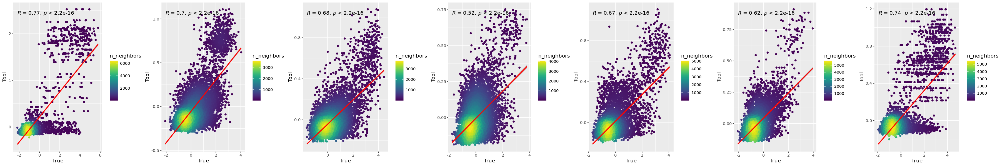

In [705]:
options(repr.plot.width = 30, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 7)
ggsave(file.path(out.figs.dir, 'cytospace.markers.exp.pdf'), width = 30, height = 5)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


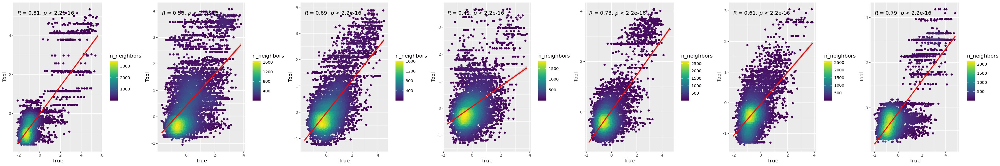

In [706]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cell2spatial, idx, spot.col = 'SpotName')   
})

options(repr.plot.width = 30, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 7)
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.exp.pdf'), width = 30, height = 5)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


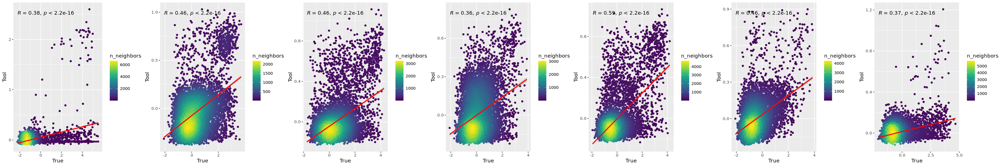

In [707]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, tangram, idx, spot.col = 'SpotID')   
})

options(repr.plot.width = 30, repr.plot.height = 5)
ggarrange(plotlist = gps, ncol = 7)
ggsave(file.path(out.figs.dir, 'tangram.markers.exp.pdf'), width = 30, height = 5)

#### Accuracy analysis

In [634]:
true.res <- seurat.res$predicted.id

In [611]:
cell2sp.pres <- cell2spatial@meta.data

In [2]:
cell2sp.pres <- cell2spatial@meta.data$Cell2Spatial %>% `names<-`(cell2spatial$SpotName)
cell2sp.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- cell2sp.pres[cell2sp.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
    #length(intersect(spots.1, spots.2)) / length(union(spots.1, spots.2))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))

In [613]:
meta.cyto <- cytospace@meta.data
meta.cyto <- meta.cyto[!duplicated(meta.cyto$SpotID), ]
cyto.pres <- meta.cyto$CellType %>% `names<-`(meta.cyto$SpotID)

In [2]:
cyto.res <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
   spots.1 <- intersect(spots.1, names(cyto.pres))
    spots.2 <- cyto.pres[cyto.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))

In [615]:
meta.tang <- tangram@meta.data
meta.tang <- meta.tang[!duplicated(meta.tang$SpotID), ]
tang.pres <- meta.tang$subclass %>% `names<-`(meta.tang$SpotID)

In [1]:
tang.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- tang.pres[tang.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))

In [620]:
plot.df <- cbind.data.frame(Cell2Spatial = cyto.res, CytoSPACE = cell2sp.pres, Tangram = tang.pres, CellType = names(cell2sp.pres))
plot.df <- tidyr::gather(plot.df, 'Methods', 'Accuracy', -CellType)

In [1]:
options(repr.plot.width = 12, repr.plot.height = 5)
gp <- ggplot(plot.df, aes(x = CellType, y = Accuracy, fill = Methods)) + geom_bar(stat = 'identity', position=position_dodge()) + theme_bw() +  theme(axis.text.x = element_text(angle = 45, hjust = 1)) + scale_fill_manual(values = MTH_COLOR[c('Cell2Spatial', 'CytoSPACE', 'Tangram')]) + xlab('') + ggtitle('Mouse Brain: 10x Genomics Xenium In Situ')
ggsave(file.path(out.figs.dir, 'accruact.pdf'), width = 12, height = 5)